<center><h1>Shah_Unnati_HW4</h1></center>
<br>
<br>

Name: Unnati Bhaven Shah
<br>
Github Username: unnatibshah
<br>
USC ID: 4512915005

## 1. Time Series Classification Part 1: Feature Creation/Extraction (HW3 Rerun)

### (a) Obtain Data

Import packages

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import math
import random
import os
import re
import csv
import statsmodels.api as sm
import statsmodels.formula.api as smf
import warnings
warnings.filterwarnings('ignore')
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.utils import resample

Get the AReM Data Set

In [2]:
data_root = "../data/AReM/"

actvt_dirs = ["bending1", "bending2", "cycling", "lying", "sitting", "standing", "walking"]
orig_columns = ['# Columns: time', 'avg_rss12', 'var_rss12', 'avg_rss13', 'var_rss13', 'avg_rss23', 'var_rss23']


### (b) Splitting Data

In [3]:
def split_train_test(root):
    train_files = []
    test_files = []
    for root, _, file in os.walk(data_root):
        for f in file:
            if (os.path.splitext(f)[1] == ".csv"):
                csv_idx = int(re.findall("\d+", f)[0])
                file_path = os.path.join(root, f)
                activity = os.path.split(root)[-1]
                if (csv_idx <= 2 or (activity not in ["bending1", "bending2"] and csv_idx == 3)):
                    test_files.append(file_path)
                else:
                    train_files.append(file_path)
    return train_files, test_files

In [4]:
# split instances
train_files, test_files = split_train_test(data_root)

In [5]:
train_files

['../data/AReM/bending1/dataset7.csv',
 '../data/AReM/bending1/dataset6.csv',
 '../data/AReM/bending1/dataset4.csv',
 '../data/AReM/bending1/dataset5.csv',
 '../data/AReM/bending1/dataset3.csv',
 '../data/AReM/walking/dataset7.csv',
 '../data/AReM/walking/dataset6.csv',
 '../data/AReM/walking/dataset4.csv',
 '../data/AReM/walking/dataset5.csv',
 '../data/AReM/walking/dataset10.csv',
 '../data/AReM/walking/dataset11.csv',
 '../data/AReM/walking/dataset13.csv',
 '../data/AReM/walking/dataset12.csv',
 '../data/AReM/walking/dataset15.csv',
 '../data/AReM/walking/dataset14.csv',
 '../data/AReM/walking/dataset8.csv',
 '../data/AReM/walking/dataset9.csv',
 '../data/AReM/bending2/dataset6.csv',
 '../data/AReM/bending2/dataset4.csv',
 '../data/AReM/bending2/dataset5.csv',
 '../data/AReM/bending2/dataset3.csv',
 '../data/AReM/standing/dataset7.csv',
 '../data/AReM/standing/dataset6.csv',
 '../data/AReM/standing/dataset4.csv',
 '../data/AReM/standing/dataset5.csv',
 '../data/AReM/standing/dataset

In [6]:
test_files

['../data/AReM/bending1/dataset1.csv',
 '../data/AReM/bending1/dataset2.csv',
 '../data/AReM/walking/dataset1.csv',
 '../data/AReM/walking/dataset2.csv',
 '../data/AReM/walking/dataset3.csv',
 '../data/AReM/bending2/dataset1.csv',
 '../data/AReM/bending2/dataset2.csv',
 '../data/AReM/standing/dataset1.csv',
 '../data/AReM/standing/dataset2.csv',
 '../data/AReM/standing/dataset3.csv',
 '../data/AReM/sitting/dataset1.csv',
 '../data/AReM/sitting/dataset2.csv',
 '../data/AReM/sitting/dataset3.csv',
 '../data/AReM/lying/dataset1.csv',
 '../data/AReM/lying/dataset2.csv',
 '../data/AReM/lying/dataset3.csv',
 '../data/AReM/cycling/dataset1.csv',
 '../data/AReM/cycling/dataset2.csv',
 '../data/AReM/cycling/dataset3.csv']

### (c) Feature Extraction

In [7]:
def load_data(files, feature, orig_columns, segs=1, standard=False):
    sniffer = csv.Sniffer()
    
    describe_order = ['mean', 'std', 'min', '_1stquart_', 'median', '_3rdquart_','max']
    desc_order_idx = [desc + str(i) for i in range(1, 6 * segs + 1) for desc in describe_order]
    
    instances  = []
    labels = []
    for csv in files:

        parent_folder = os.path.dirname(csv)
        activity = os.path.split(parent_folder)[-1]
        labels.append(activity)
        
        sep = sniffer.sniff(open(csv).read()).delimiter
        
        if sep == ",":
            cur_instance = pd.read_csv(csv, skiprows=5, header=None, 
                                      on_bad_lines='warn')
        else:
            cur_instance = pd.read_csv(csv, skiprows=5, header=None, sep="\s+", 
                                      on_bad_lines='warn')
        
        cur_instance.columns = orig_columns
        
        seg_length = int(cur_instance.shape[0] / segs)
        segs_describe = []
        for i in range(segs):
            cur_seg = cur_instance[i * seg_length : min((i + 1) * seg_length, cur_instance.shape[0])]
            cur_describe = cur_seg.describe().drop('count').drop(columns="# Columns: time").T
            segs_describe.append(cur_describe.values.flatten())
    
        instances.append(np.concatenate(segs_describe, axis=None))
    
   
    feature_df = pd.DataFrame(instances, columns=desc_order_idx)
    feature_df = feature_df.loc[:, feature]
    
    if standard:
        feature_df = feature_df.apply(lambda col: (col-col.mean()) / (np.std(col) + 1e-9), axis = 0)
    
    
    feature_df['label'] = pd.Series(labels)
    
    return feature_df

In [8]:
statistics = ['min','max','mean','median','std','_1stquart_', '_3rdquart_']
feature = [stat + str(i) for i in range(1, 7) for stat in statistics]

train_data = load_data(train_files, feature, orig_columns)
test_data = load_data(test_files, feature, orig_columns)


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



In [9]:
train_data

,min1,max1,mean1,median1,std1,_1stquart_1,_3rdquart_1,min2,max2,mean2,...,_1stquart_5,_3rdquart_5,min6,max6,mean6,median6,std6,_1stquart_6,_3rdquart_6,label
0,36.25,48.00,43.969125,44.50,1.618364,43.310,44.67,0.0,1.50,0.413125,...,20.5000,23.7500,0.0,2.96,0.555312,0.490,0.487826,0.0000,0.830,bending1
1,37.00,48.00,43.454958,43.25,1.386098,42.500,45.00,0.0,1.58,0.378083,...,22.2500,24.0000,0.0,5.26,0.679646,0.500,0.622534,0.4300,0.870,bending1
2,33.00,47.75,42.179812,43.50,3.670666,39.150,45.00,0.0,3.00,0.696042,...,30.4575,36.3300,0.0,2.18,0.613521,0.500,0.524317,0.0000,1.000,bending1
3,33.00,45.75,41.678063,41.75,2.243490,41.330,42.75,0.0,2.83,0.535979,...,28.4575,31.2500,0.0,1.79,0.383292,0.430,0.389164,0.0000,0.500,bending1
4,35.00,47.40,43.954500,44.33,1.558835,43.000,45.00,0.0,1.70,0.426250,...,35.3625,36.5000,0.0,1.79,0.493292,0.430,0.513506,0.0000,0.940,bending1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,18.50,44.25,35.752354,36.00,4.614802,33.000,39.33,0.0,12.60,3.328104,...,14.0000,18.0625,0.0,9.39,3.069667,2.770,1.748326,1.7975,4.060,cycling
65,24.25,45.00,37.177042,36.25,3.581301,34.500,40.25,0.0,8.58,2.374208,...,17.9500,21.7500,0.0,9.34,2.921729,2.500,1.852600,1.5000,3.900,cycling
66,23.33,43.50,36.248768,36.75,3.824632,33.415,39.25,0.0,9.71,2.737307,...,15.7500,21.0000,0.0,11.15,3.532463,3.110,1.965267,2.1700,4.625,cycling
67,26.25,44.25,36.957458,36.29,3.434863,34.500,40.25,0.0,8.64,2.420083,...,14.0000,18.2500,0.0,8.34,2.934625,2.525,1.631380,1.6600,4.030,cycling


In [10]:
test_data

,min1,max1,mean1,median1,std1,_1stquart_1,_3rdquart_1,min2,max2,mean2,...,_1stquart_5,_3rdquart_5,min6,max6,mean6,median6,std6,_1stquart_6,_3rdquart_6,label
0,37.25,45.00,40.624792,40.500,1.476967,39.2500,42.0000,0.0,1.30,0.358604,...,33.0000,36.0000,0.0,1.92,0.570583,0.430,0.582915,0.0000,1.300,bending1
1,38.00,45.67,42.812812,42.500,1.435550,42.0000,43.6700,0.0,1.22,0.372437,...,32.0000,34.5000,0.0,3.11,0.571083,0.430,0.601010,0.0000,1.300,bending1
2,19.33,43.50,34.227771,35.500,4.889576,30.5000,37.7500,0.0,14.50,3.995729,...,14.7500,18.6700,0.0,9.74,3.394125,3.100,1.792090,2.1050,4.425,walking
3,12.50,45.00,33.509729,34.125,4.850923,30.5000,36.7500,0.0,13.05,4.450771,...,14.6275,18.7500,0.0,8.96,3.378479,3.085,1.787360,2.0600,4.440,walking
4,15.00,46.75,34.660583,35.000,5.315110,31.0000,38.2500,0.0,13.44,4.200896,...,14.2500,18.5000,0.0,8.99,3.244396,3.000,1.630983,2.1200,4.240,walking
5,12.75,51.00,24.562958,24.250,3.737514,23.1875,26.5000,0.0,6.87,0.590833,...,20.5000,27.0000,0.0,4.97,0.700188,0.500,0.693720,0.4300,0.870,bending2
6,0.00,42.75,27.464604,28.000,3.583582,25.5000,30.0000,0.0,7.76,0.449708,...,15.0000,20.7500,0.0,6.76,1.122125,0.830,1.012342,0.4700,1.300,bending2
7,33.33,48.00,44.334729,45.000,2.476940,42.2500,46.5000,0.0,3.90,0.432958,...,9.3300,17.7500,0.0,5.02,0.933000,0.830,0.673609,0.4700,1.250,standing
8,35.50,46.25,43.174938,43.670,1.989052,42.5000,44.5000,0.0,2.12,0.506583,...,12.7500,16.5000,0.0,5.72,0.911979,0.830,0.666161,0.4700,1.220,standing
9,32.75,47.00,42.760562,44.500,3.398919,41.3300,45.3725,0.0,3.34,0.486167,...,13.0000,18.5650,0.0,5.73,0.842271,0.710,0.722165,0.4300,1.090,standing


In [11]:
train_data.describe().loc['std']

min1           8.794295
max1           4.429182
mean1          4.917692
median1        4.956111
std1           1.758670
_1stquart_1    5.731647
_3rdquart_1    4.783645
min2           0.000000
max2           5.147841
mean2          1.600701
median2        1.436960
std2           0.902808
_1stquart_2    0.952201
_3rdquart_2    2.158416
min3           3.053869
max3           4.759853
mean3          3.863097
median3        3.845730
std3           0.995959
_1stquart_3    4.145255
_3rdquart_3    3.946023
min4           0.000000
max4           2.302408
mean4          1.179861
median4        1.150092
std4           0.473576
_1stquart_4    0.842501
_3rdquart_4    1.566564
min5           5.368786
max5           5.449726
mean5          5.120426
median5        5.267414
std5           1.057998
_1stquart_5    5.543882
_3rdquart_5    4.957231
min6           0.051766
max6           2.540166
mean6          1.171401
median6        1.104626
std6           0.519420
_1stquart_6    0.774358
_3rdquart_6    1

In [12]:
test_data.describe().loc['std']

min1           12.136206
max1            4.379342
mean1           6.790086
median1         7.088085
std1            1.869285
_1stquart_1     7.673052
_3rdquart_1     6.385720
min2            0.000000
max2            4.870395
mean2           1.500529
median2         1.345903
std2            0.832472
_1stquart_2     0.941307
_3rdquart_2     2.028482
min3            2.644618
max3            5.393220
mean3           4.588252
median3         4.753522
std3            0.760779
_1stquart_3     4.554121
_3rdquart_3     5.014339
min4            0.000000
max4            1.733937
mean4           1.146338
median4         1.161705
std4            0.409008
_1stquart_4     0.867088
_3rdquart_4     1.541943
min5            8.252947
max5            6.782153
mean5           7.366781
median5         7.438749
std5            0.919274
_1stquart_5     7.823870
_3rdquart_5     7.259433
min6            0.000000
max6            2.505306
mean6           1.119410
median6         1.037811
std6            0.525263


In [13]:
data = train_data.iloc[:, :-1]
ans = []
for sample in range(1000):
    resampled = resample(data)
    temp = resampled.apply(lambda col: np.std(col))
    ans.append(temp)

ans = pd.DataFrame(ans)
ans.columns = list(data.columns)
interval = ans.apply(lambda col : (np.percentile(col, 5), np.percentile(col, 95)), axis=0)
interval.apply(np.around, args=(2,))
interval = interval.T
interval.columns = ['5%', '95%']
interval

,5%,95%
min1,7.439671,10.155971
max1,3.215233,5.370877
mean1,4.334572,5.359803
median1,4.300715,5.440143
std1,1.536290,1.925526
_1stquart_1,5.145058,6.133199
_3rdquart_1,3.899976,5.492641
min2,0.000000,0.000000
max2,4.596557,5.495108
mean2,1.394133,1.727482


## 2. Time Series Classification Part 2: Binary and Multiclass Classification

### (a) Binary Classification Using Logistic Regression

#### i. Plots

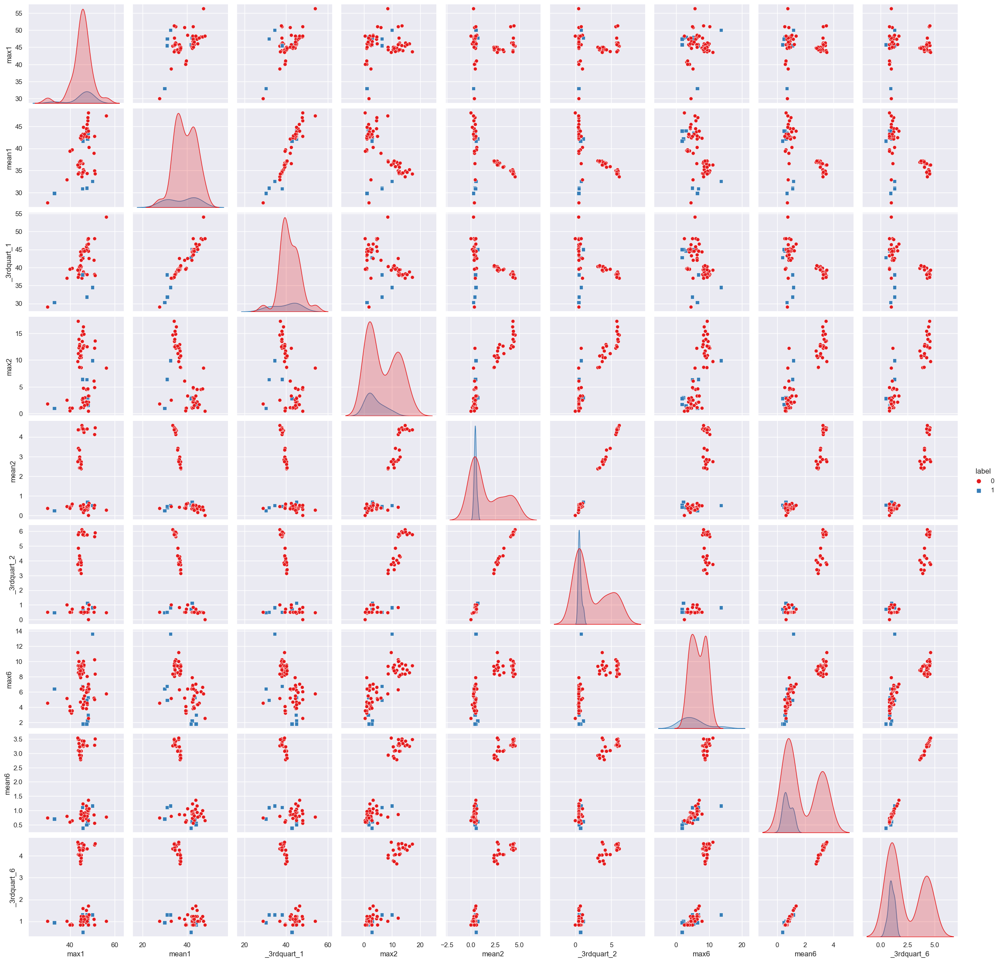

In [14]:
class Plots:
    def __init__(self, data, style="whitegrid", palette="Set2"):
        self.data = data
        self.style = style
        self.palette = palette

    @staticmethod
    def generate_column_names(indexes, props):
        cols = [f"{prop}{index}" for index in indexes for prop in props]
        return cols

    @staticmethod
    def preprocess_labels(df):
        df['label'] = df['label'].apply(lambda x: 1 if x in ['bending1', 'bending2'] else 0)
        return df

    def plot_pairplot(self, hue_value):
        sns.set(style=self.style, palette=self.palette)
        relevant_columns = self.generate_column_names([1, 2, 6], ['max', 'mean', '_3rdquart_'])
        relevant_columns_labelled = relevant_columns + ['label']
        relevant_df = self.data[relevant_columns_labelled]

        sns.pairplot(relevant_df, hue=hue_value, diag_kind='kde', markers=["o", "s"])
        plt.show()

analysis = Plots(train_data, style="darkgrid", palette="Set1")

analysis.preprocess_labels(train_data)

analysis.plot_pairplot(hue_value='label')

#### ii. Splitted Plots

Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



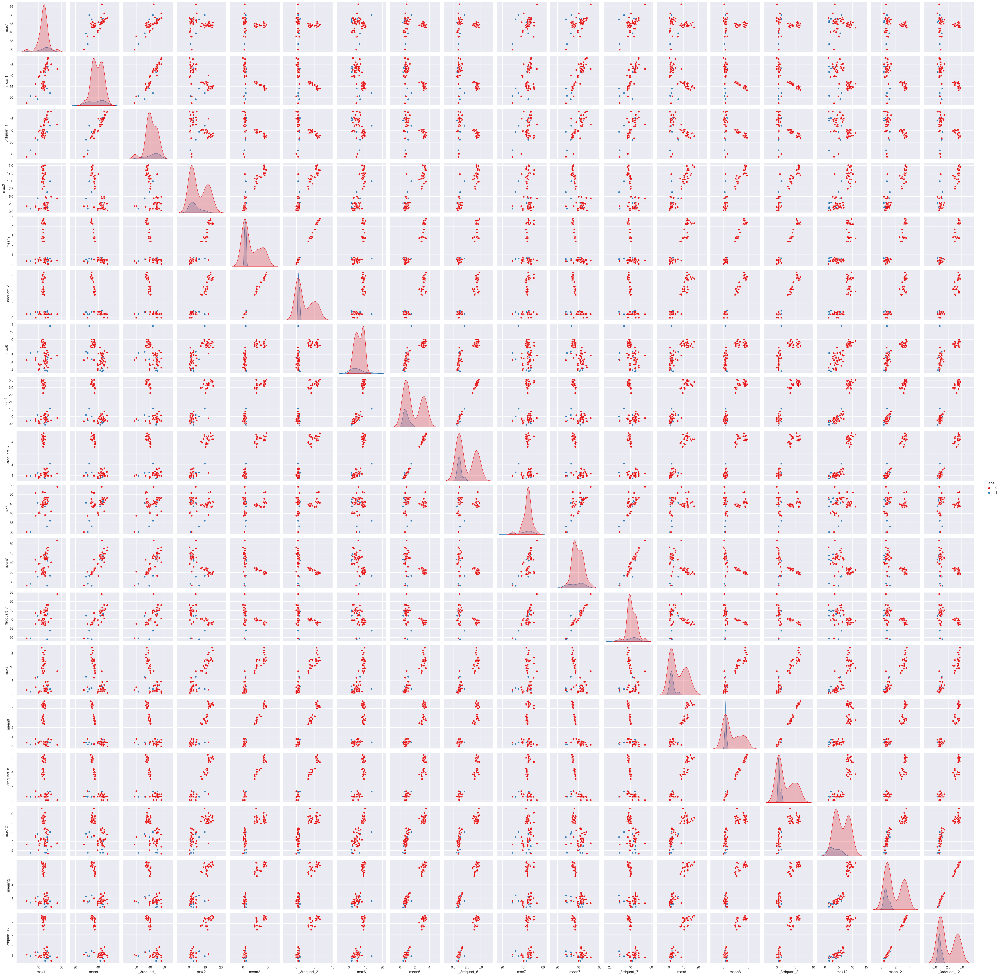

In [15]:
class SplitPlots:
    def __init__(self, style="whitegrid", palette="Set2"):
        self.style = style
        self.palette = palette

    @staticmethod
    def transform_labels_to_binary(df):
        df['label'] = df['label'].apply(lambda label: 1 if label in ['bending1', 'bending2'] else 0)
        return df

    def process_data(self):
        selected_features = [f'{stat}{i}' for i in range(1, 13) for stat in statistics]
        train_data_two = load_data(train_files, selected_features, orig_columns, segs=2)
        test_data_two = load_data(test_files, selected_features, orig_columns, segs=2)
        train_df_two = self.transform_labels_to_binary(pd.DataFrame(train_data_two))
        test_df_two = self.transform_labels_to_binary(pd.DataFrame(test_data_two))
        relevant_columns_two = [f'{stat}{idx}' for idx in [1, 2, 6, 7, 8, 12] for stat in ['max', 'mean', '_3rdquart_']]
        relevant_columns_labelled_two = relevant_columns_two + ['label']
        relevant_df_two = train_df_two[relevant_columns_labelled_two]
        return relevant_df_two

    def plot_scatter_plot(self, df, hue_value):
        sns.set(style=self.style, palette=self.palette)
        sns.pairplot(df, hue=hue_value)
        plt.show()

analysis = SplitPlots(style="darkgrid", palette="Set1")

relevant_df_two = analysis.process_data()

analysis.plot_scatter_plot(relevant_df_two, 'label')

Both of the results seem to be almost the same on first glance. There is no significant difference between the two.

#### iii. Time Series Segments

In [16]:
class LogisticRegressionAnalyzer:
    def __init__(self, train_files, test_files, statistics, orig_columns, cross_validation_factor=5, L=20):
        self.train_files = train_files
        self.test_files = test_files
        self.statistics = statistics
        self.orig_columns = orig_columns
        self.cross_validation_factor = cross_validation_factor
        self.L = L

    def generate_feature_names(self, range_end):
        features = []
        for i in range(1, range_end):
            for stat in self.statistics:
                features.append(f'{stat}{i}')
        return features

    def oversample_dataset(self, data):
        print('Performing dataset oversampling...')
        label_0_count = data[data['label'] == "0"].shape[0]
        label_1_count = data[data['label'] == "1"].shape[0]
        minor_class_count = min(label_0_count, label_1_count)

        if label_0_count > label_1_count:
            minor_label, major_label = "1", "0"
        else:
            minor_label, major_label = "0", "1"

        minor_data = data[data['label'] == minor_label]
        major_data = data[data['label'] == major_label]

        minor_data = resample(minor_data, replace=True, random_state=60, n_samples=max(label_0_count, label_1_count))
        data = pd.concat([major_data, minor_data])

        return data

    def map_text_labels_to_boolean(self, df):
        df['label'] = df['label'].apply(lambda label: "1" if label in ['bending1', 'bending2'] else "0")
        return df

    def split_data_into_X_and_Y(self, data):
        data_X = data.iloc[:, :-1]
        data_Y = data.iloc[:, -1]
        return data_X, data_Y

    def run_logistic_regression(self, l_value, fold_count, oversample=False, penalty='none'):
        print(f'Running Logistic Regression for l-value {l_value}')
        feature_names = self.generate_feature_names(6 * l_value + 1)
        train_data = load_data(self.train_files, feature_names, self.orig_columns, segs=l_value)
        train_data = self.map_text_labels_to_boolean(pd.DataFrame(train_data))

        if oversample:
            train_data = self.oversample_dataset(train_data)

        train_X, train_Y = self.split_data_into_X_and_Y(train_data)

        solver_type = 'liblinear' if penalty == 'l1' else 'lbfgs'
        cross_validator = StratifiedKFold(n_splits=fold_count, shuffle=True, random_state=69)
        model = LogisticRegression(penalty=penalty, solver=solver_type, max_iter=100)
        feature_selector = RFECV(estimator=model, cv=cross_validator, scoring='accuracy')
        feature_selector.fit(train_X, train_Y)
        return model, feature_selector

    def analyze_logistic_regression(self):
        result_combinations = {
            'pair(l, p)': [],
            'score': []
        }

        for l_value in range(1, self.L + 1):
            model, selector = self.run_logistic_regression(l_value, self.cross_validation_factor, oversample=False)
            num_selected_features = selector.n_features_
            max_test_score = selector.cv_results_['mean_test_score'].max()
            result_combinations['pair(l, p)'].append((l_value, num_selected_features))
            result_combinations['score'].append(round(max_test_score, 4))

        result_dataframe = pd.DataFrame(result_combinations)
        return result_dataframe

analyzer = LogisticRegressionAnalyzer(train_files, test_files, statistics, orig_columns)

result_df = analyzer.analyze_logistic_regression()

print(result_df)


Running Logistic Regression for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 2


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 3


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 4


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 5


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 6


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 7


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 8


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 9


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 10


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 11


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 12


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 13


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 14


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 15


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 16


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 17


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 18


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 19


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Running Logistic Regression for l-value 20


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



   pair(l, p)   score
0      (1, 6)  1.0000
1      (2, 5)  0.9429
2      (3, 7)  0.9857
3      (4, 9)  0.9714
4      (5, 3)  0.9857
5     (6, 36)  0.9857
6     (7, 16)  0.9714
7     (8, 31)  0.9714
8     (9, 43)  0.9857
9    (10, 47)  0.9714
10    (11, 9)  0.9857
11   (12, 85)  0.9857
12   (13, 12)  0.9857
13   (14, 15)  0.9714
14   (15, 37)  0.9857
15   (16, 12)  0.9857
16   (17, 11)  0.9857
17    (18, 9)  0.9857
18   (19, 10)  0.9857
19   (20, 11)  0.9857


The primary objective of cross-validation is to provide a robust estimation of predictive performance on unseen test data. It ensures that our algorithm effectively leverages the array of available predictors in our dataset. Consequently, the proper sequence involves performing Recursive Feature Elimination (RFE) within the context of Cross Validation.

In contrast, conducting RFE prior to Cross Validation would be a flawed approach.



#### iv. Confusion Matrix

In [17]:
def extract_selected_features(features, selector):
    selected_features = [feature for feature, is_selected in zip(features, selector.support_) if is_selected]
    return selected_features
    
classifier, selected_features = analyzer.run_logistic_regression(1, 5)  # The [1] index returns the feature_selector
selected_feature_names = analyzer.generate_feature_names(6 * 1 + 1)
selected_features = extract_selected_features(selected_feature_names, selected_features)

print(selected_features)

Running Logistic Regression for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



['mean1', '_3rdquart_1', 'max2', 'min5', 'max5', '_1stquart_5']


In [18]:
train_set = load_data(train_files, selected_features, orig_columns, segs=1)
train_set = analyzer.map_text_labels_to_boolean(pd.DataFrame(train_set))
train_X, train_Y = analyzer.split_data_into_X_and_Y(train_set)
selected_features_df = train_X[selected_features]
const_matrix = sm.add_constant(selected_features_df.to_numpy(dtype=float))
logistic_model = sm.Logit(train_Y.to_numpy(dtype=float), const_matrix)
summary = logistic_model.fit(method='bfgs').summary()
print(summary)

Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 27
         Function evaluations: 30
         Gradient evaluations: 30
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   69
Model:                          Logit   Df Residuals:                       62
Method:                           MLE   Df Model:                            6
Date:                Mon, 16 Oct 2023   Pseudo R-squ.:                   1.000
Time:                        22:55:45   Log-Likelihood:            -8.8338e-06
converged:                       True   LL-Null:                       -26.718
Covariance Type:            nonrobust   LLR p-value:                 9.588e-10
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.7796   1.51e+07  -5.1

Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



[[60  0]
 [ 0  9]]


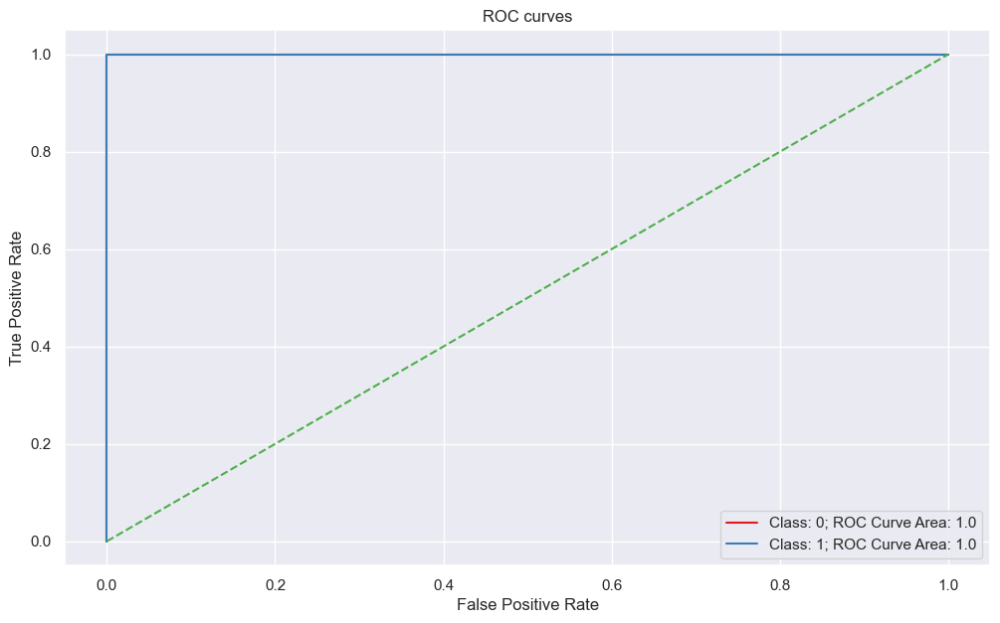

In [19]:
class ClassificationAnalyzer:
    def __init__(self, classifier):
        self.classifier = classifier

    def plot_roc_curves(self, true_labels, predicted_probabilities):
        fig, axes = plt.subplots(figsize=(12, 7))
        axes.set_title("ROC curves")

        for i, class_label in enumerate(self.classifier.classes_):
            predicted_prob = predicted_probabilities[:, i]
            fpr, tpr, thresholds = roc_curve(true_labels, predicted_prob, pos_label=class_label)
            roc_auc = auc(fpr, tpr)
            axes.plot(fpr, tpr, label=f"Class: {class_label}; ROC Curve Area: {round(roc_auc, 4)}")

        axes.plot([0, 1], [0, 1], "--")
        axes.set_xlabel("False Positive Rate")
        axes.set_ylabel("True Positive Rate")
        axes.legend()
        plt.show()

    def perform_classification_and_roc_calculation(self, data_X, data_Y, selected_features, is_test=False):
        if not is_test:
            self.classifier.fit(data_X.loc[:, selected_features], data_Y.to_numpy(dtype="int"))

        predicted_Y = self.classifier.predict(data_X.loc[:, selected_features])
        predicted_Y_prob = self.classifier.predict_proba(data_X.loc[:, selected_features])

        true_Y = data_Y.to_numpy(dtype=float)
        predicted_Y_rounded = predicted_Y.round()

        confusion_matrix_result = confusion_matrix(true_Y, predicted_Y_rounded)
        print(confusion_matrix_result)

        self.plot_roc_curves(true_Y, predicted_Y_prob)

class_analyzer = ClassificationAnalyzer(classifier)
class_analyzer.perform_classification_and_roc_calculation(train_X, train_Y, selected_features)


#### v. Test Classifier

In [20]:
test_set = load_data(test_files, selected_features, orig_columns, segs=1)
test_set = analyzer.map_text_labels_to_boolean(pd.DataFrame(test_set))
test_X, test_Y = analyzer.split_data_into_X_and_Y(test_set)
test_X


,mean1,_3rdquart_1,max2,min5,max5,_1stquart_5
0,40.624792,42.0000,1.30,27.25,38.25,33.0000
1,42.812812,43.6700,1.22,27.67,38.50,32.0000
2,34.227771,37.7500,14.50,6.75,26.00,14.7500
3,33.509729,36.7500,13.05,7.25,25.00,14.6275
4,34.660583,38.2500,13.44,7.00,24.50,14.2500
5,24.562958,26.5000,6.87,10.67,30.00,20.5000
6,27.464604,30.0000,7.76,0.00,33.00,15.0000
7,44.334729,46.5000,3.90,0.00,23.00,9.3300
8,43.174938,44.5000,2.12,2.00,21.25,12.7500
9,42.760562,45.3725,3.34,1.33,21.33,13.0000


[[15  0]
 [ 0  4]]


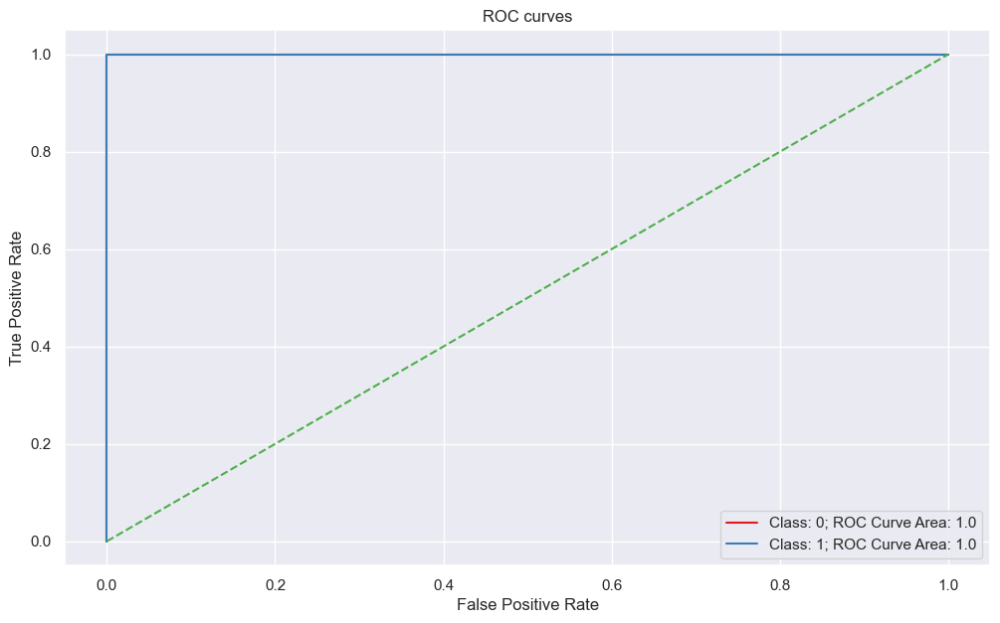

In [21]:
class_analyzer.perform_classification_and_roc_calculation(test_X, test_Y, selected_features, is_test=True)

The accuracy for test as well as cross validation seems to be almost same.

#### vi. Separation

The p-value analysis conducted using statmodel indicates a scenario of complete separation. This analysis also implies the presence of complete separation in the results. When such complete separation occurs, the Maximum Likelihood Estimator becomes unattainable, rendering the parameters unidentifiable.

The identified complete separation of classes may contribute to the instability encountered during the calculation of regression parameters.


#### vii. Imbalance

As per my assignment, a label of 0 corresponds to non-bending classes, and a label of 1 corresponds to bending classes. The confusion matrices clearly indicate an imbalance in the class distribution, with 69 instances belonging to non-bending classes and only 9 instances representing bending classes.


Given that the answer to the previous observation is affirmative, it implies that we need to construct a regression model using case-controlled sampling, specifically oversampling.

In [22]:
cross_validation_factor = 5
L = 20
combination = {
    'pair(l, p)': [],
    'score': []
}
for l_val in range(1, L + 1):
    model, selector = analyzer.run_logistic_regression(l_val, cross_validation_factor, oversample=True)
    nf = selector.n_features_
    score = selector.cv_results_['mean_test_score'].max()
    combination['pair(l, p)'].append((l_val, nf))
    combination['score'].append(round(score, 4))

df = pd.DataFrame(combination)
df

Running Logistic Regression for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 2


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 3


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 4


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 5


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 6


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 7


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 8


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 9


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 10


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 11


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 12


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 13


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 14


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 15


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 16


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 17


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 18


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 19


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...
Running Logistic Regression for l-value 20


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...


,"pair(l, p)",score
0,"(1, 4)",1.0000
1,"(2, 7)",0.9833
2,"(3, 3)",1.0000
3,"(4, 3)",0.9917
4,"(5, 3)",0.9917
5,"(6, 3)",0.9917
6,"(7, 2)",0.9917
7,"(8, 3)",0.9917
8,"(9, 9)",1.0000
9,"(10, 6)",1.0000


In [23]:
l_val = 1
fold_count = 5

selected_features = analyzer.generate_feature_names(6 * l_val + 1)

classifier, selector = analyzer.run_logistic_regression(l_val, fold_count, oversample=True)

selected_features = extract_selected_features(selected_features, selector)
selected_features


Running Logistic Regression for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Performing dataset oversampling...


['_3rdquart_1', 'min5', 'max5', 'mean5']

Performing dataset oversampling...
[[60  0]
 [ 0 60]]


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



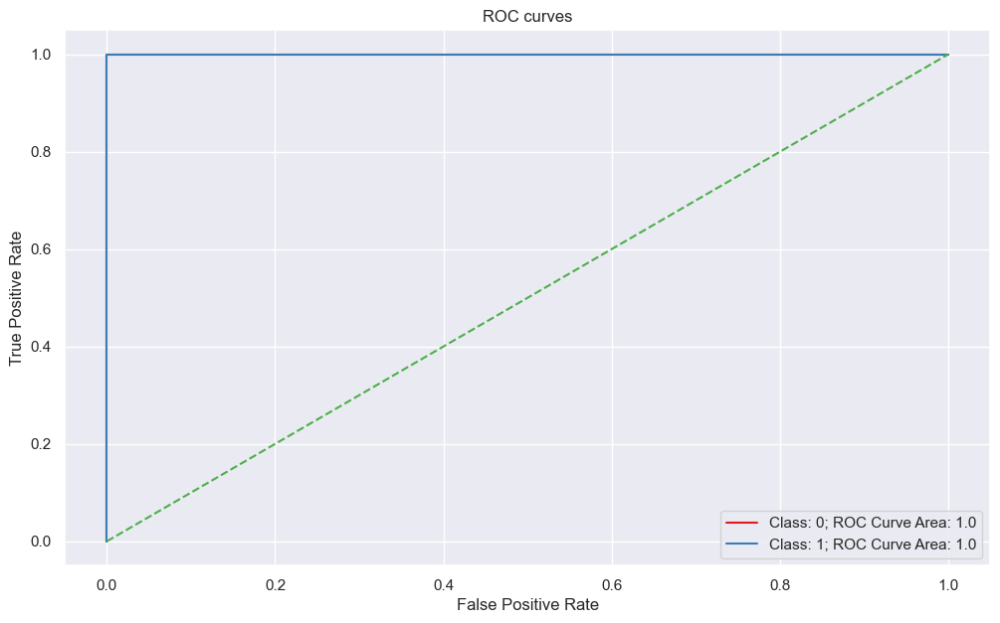

In [24]:
training_data = load_data(train_files, selected_features, orig_columns, segs=1)

training_data = analyzer.map_text_labels_to_boolean(pd.DataFrame(training_data))

training_data = analyzer.oversample_dataset(training_data)

trainX, trainY = analyzer.split_data_into_X_and_Y(training_data)

class_analyzer.perform_classification_and_roc_calculation(trainX, trainY, selected_features, is_test=False)


[[15  0]
 [ 0  4]]


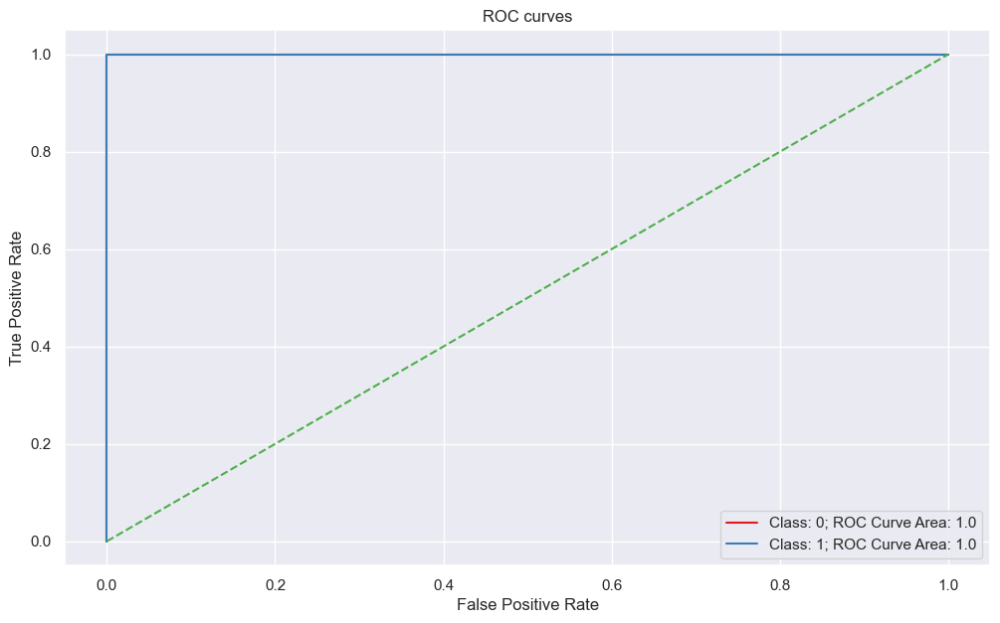

In [25]:
test_data = load_data(test_files, selected_features, orig_columns, segs=1)
test_data = analyzer.map_text_labels_to_boolean(pd.DataFrame(test_data))
testX, testY = analyzer.split_data_into_X_and_Y(test_data)
class_analyzer.perform_classification_and_roc_calculation(testX, testY, selected_features, is_test=True)


### (b) Binary Classification Using L1-penalized logistic regression

#### i. Time Series Segments

In [26]:
max_test_accuracy = 0
optimal_L = 1
def plot_roc_curve(actualY, predictedY_prob, classifier):
    fig, axes = plt.subplots(figsize=(12, 7))
    axes.set_title("ROC curves")
    for i, clazz in enumerate(classifier.classes_):
        y_predicted = predictedY_prob[:, i]
        fpr, tpr, thresholds = roc_curve(actualY, y_predicted, pos_label=clazz)
        roc_auc = auc(fpr, tpr)
        axes.plot(fpr, tpr, label=f"Class: {clazz}; ROC Curve Area: {round(roc_auc, 4)}")
    axes.plot([0, 1], [0, 1], "--")
    axes.set_xlabel("False Positive Rate")
    axes.set_ylabel("True Positive Rate")
    axes.legend()
    plt.show()

def run_classifier_with_metrics(classifier, classifier_name, l_val, kwargs, penalty='none', 
                                is_binary_classification=True, draw_roc=False):
    print(f'Running {classifier_name} for l-value {l_val}')
    
    features = analyzer.generate_feature_names(6 * l_val + 1)
    
    train_set = load_data(train_files, features, orig_columns, segs=l_val)
    test_set = load_data(test_files, features, orig_columns, segs=l_val)
    
    if is_binary_classification:

        train_set = analysis.transform_labels_to_binary(pd.DataFrame(train_set))
        test_set = analysis.transform_labels_to_binary(pd.DataFrame(test_set))
        
    trainX, trainY = analyzer.split_data_into_X_and_Y(train_set)
    testX, testY = analyzer.split_data_into_X_and_Y(test_set)
    
    if is_binary_classification:

        trainY = trainY.astype('int')
        testY = testY.astype('int')
    
    classifier_instance = classifier(**kwargs)
    classifier_instance.fit(trainX, trainY)
    
    if not draw_roc:    
        train_score = round(classifier_instance.score(trainX, trainY), 4)
        test_score = round(classifier_instance.score(testX, testY), 4)
        print(f'Value of L: {l_val} | train_score: {train_score} | test_score: {test_score}')
        print(f'Value of L: {l_val} | train_error: {round((1 - train_score), 4)} | test_error: {round((1 - test_score), 4)}\n')
        global max_test_accuracy
        global optimal_L
        if test_score > max_test_accuracy:
            max_test_accuracy = test_score
            optimal_L = l_val
        
        if l_val == 20:
            print('\n')
            print(f'The maximum accuracy is {max_test_accuracy} (for L-value: {optimal_L})')
            print(f'Further calculations will be done with L-value: {optimal_L}')
        
    else:
        train_predictY_prob = classifier_instance.predict_proba(trainX)
        test_predictY_prob = classifier_instance.predict_proba(testX)

        predictY = classifier_instance.predict(testX)
        cm = confusion_matrix(testY, predictY)
        print(f"Confusion matrix for test data:\n{cm}")
        
        print("ROC Curve for Train Data")
        plot_roc_curve(trainY, train_predictY_prob, classifier_instance)
        
        print("ROC Curve for Test Data")
        plot_roc_curve(testY, test_predictY_prob, classifier_instance)


In [27]:
kwargs = {
    'penalty': 'l1',
    'max_iter': 100,
    'scoring': 'accuracy',
    'cv': 5,
    'random_state': 69,
    'solver': 'liblinear'
}

fold_count = 5

# Perform logistic regression for each value of L for 20 iterations
for l_val in range(1, 21):
    run_classifier_with_metrics(LogisticRegressionCV,
                               "Logistic Regression", 
                               l_val, 
                               kwargs, 
                               penalty='none',
                               is_binary_classification=True, 
                               draw_roc=False)

Running Logistic Regression for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 1 | train_score: 1.0 | test_score: 1.0
Value of L: 1 | train_error: 0.0 | test_error: 0.0

Running Logistic Regression for l-value 2


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 2 | train_score: 0.9565 | test_score: 0.9474
Value of L: 2 | train_error: 0.0435 | test_error: 0.0526

Running Logistic Regression for l-value 3


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 3 | train_score: 1.0 | test_score: 1.0
Value of L: 3 | train_error: 0.0 | test_error: 0.0

Running Logistic Regression for l-value 4


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 4 | train_score: 1.0 | test_score: 0.9474
Value of L: 4 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 5


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 5 | train_score: 1.0 | test_score: 0.9474
Value of L: 5 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 6


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 6 | train_score: 1.0 | test_score: 0.9474
Value of L: 6 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 7


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 7 | train_score: 1.0 | test_score: 1.0
Value of L: 7 | train_error: 0.0 | test_error: 0.0

Running Logistic Regression for l-value 8


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 8 | train_score: 1.0 | test_score: 0.9474
Value of L: 8 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 9


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 9 | train_score: 1.0 | test_score: 0.9474
Value of L: 9 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 10


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 10 | train_score: 1.0 | test_score: 0.9474
Value of L: 10 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 11


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 11 | train_score: 1.0 | test_score: 0.9474
Value of L: 11 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 12


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 12 | train_score: 1.0 | test_score: 1.0
Value of L: 12 | train_error: 0.0 | test_error: 0.0

Running Logistic Regression for l-value 13


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 13 | train_score: 1.0 | test_score: 1.0
Value of L: 13 | train_error: 0.0 | test_error: 0.0

Running Logistic Regression for l-value 14


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 14 | train_score: 1.0 | test_score: 0.9474
Value of L: 14 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 15


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 15 | train_score: 1.0 | test_score: 0.9474
Value of L: 15 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 16


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 16 | train_score: 1.0 | test_score: 1.0
Value of L: 16 | train_error: 0.0 | test_error: 0.0

Running Logistic Regression for l-value 17


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 17 | train_score: 1.0 | test_score: 0.9474
Value of L: 17 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 18


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 18 | train_score: 1.0 | test_score: 0.9474
Value of L: 18 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 19


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 19 | train_score: 1.0 | test_score: 0.9474
Value of L: 19 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 20


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 20 | train_score: 1.0 | test_score: 0.9474
Value of L: 20 | train_error: 0.0 | test_error: 0.0526



The maximum accuracy is 1.0 (for L-value: 1)
Further calculations will be done with L-value: 1


Running Logistic Regression for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Confusion matrix for test data:
[[15  0]
 [ 0  4]]
ROC Curve for Train Data


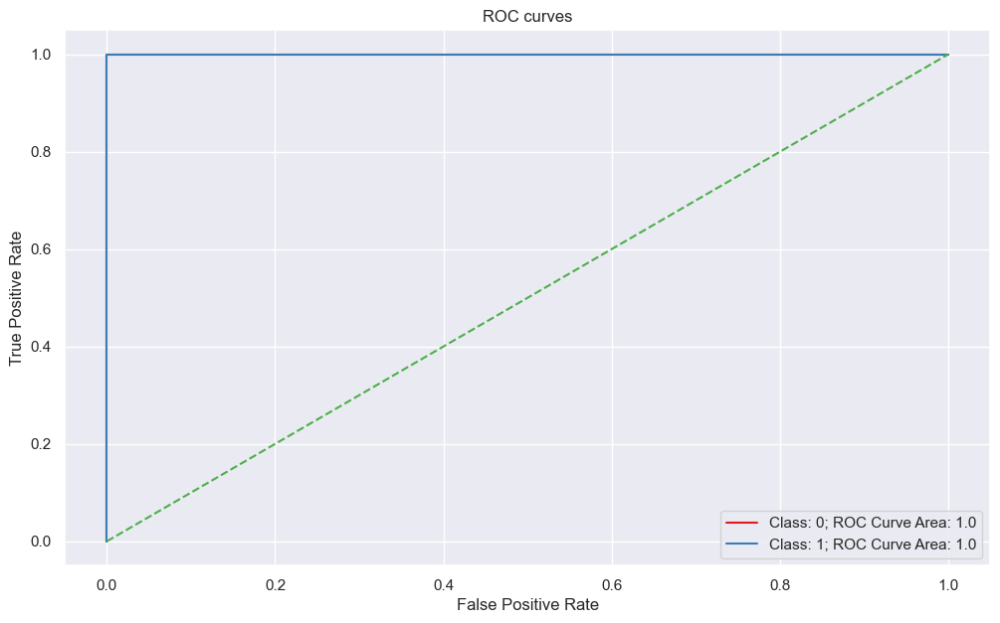

ROC Curve for Test Data


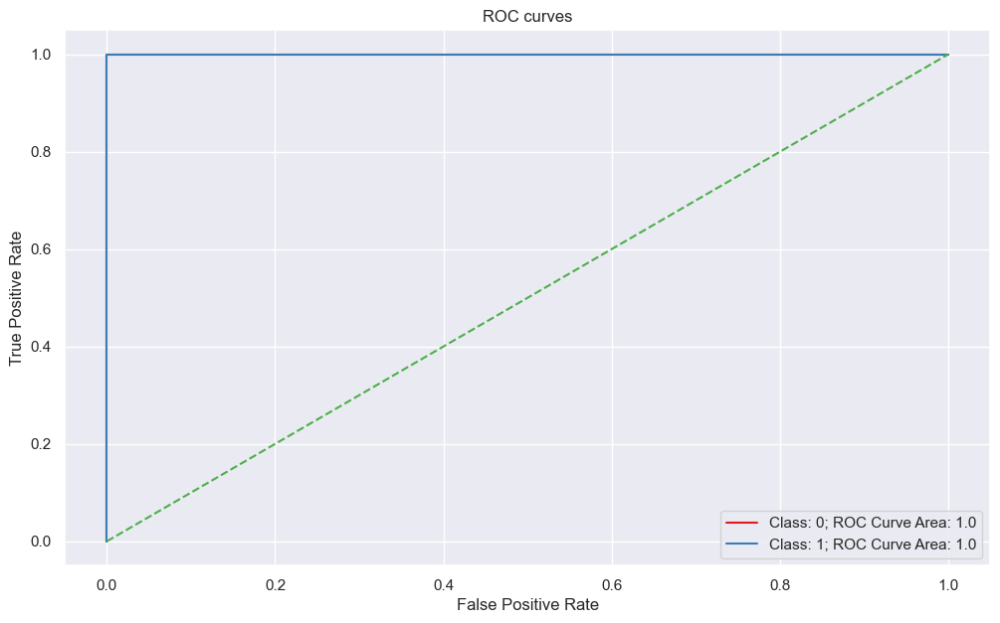

In [28]:
kwargs = {
    'penalty': 'l1',
    'max_iter': 100,
    'solver': 'liblinear'
}

fold_count = 5
best_l = 1

# Perform logistic regression with the given classifier for the best value of L calculated from a previous section
run_classifier_with_metrics(LogisticRegression,
                            "Logistic Regression",
                            best_l, 
                            kwargs, 
                            penalty='none',
                            is_binary_classification=True, 
                            draw_roc=True)


#### ii. Comparison

The L1-penalized logistic regression outperforms other methods in terms of accuracy when evaluated on the test data, achieving an accuracy of approximately ~1.0. This indicates that L1-penalization is the superior choice. Additionally, L1-regularization offers the advantage of simplified implementation, as it eliminates the need for manual feature selection.

### (c) Multi-class Classification (The Realistic Case)

#### i. Time Series Segments

In [29]:
kwargs = {
    'penalty' : 'l1', 
    'max_iter' : 100,
    'multi_class': 'multinomial',
    'cv': 5,
    'random_state' : 69,
    'solver' : 'saga'
}

fold_count = 5
global max_test_accuracy
max_test_accuracy = 0

global optimal_L
optimal_L = 1

# performing regression for each value of L for 20 iterations
for l_val in range(1, 21):
    run_classifier_with_metrics(LogisticRegressionCV, 
                                       "Logistic Regression",
                                       l_val, 
                                       kwargs, 
                                       penalty='none',
                                       is_binary_classification=False, 
                                       draw_roc=False)


Running Logistic Regression for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 1 | train_score: 1.0 | test_score: 0.8947
Value of L: 1 | train_error: 0.0 | test_error: 0.1053

Running Logistic Regression for l-value 2


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 2 | train_score: 1.0 | test_score: 0.9474
Value of L: 2 | train_error: 0.0 | test_error: 0.0526

Running Logistic Regression for l-value 3


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 3 | train_score: 1.0 | test_score: 0.8421
Value of L: 3 | train_error: 0.0 | test_error: 0.1579

Running Logistic Regression for l-value 4


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 4 | train_score: 1.0 | test_score: 0.8947
Value of L: 4 | train_error: 0.0 | test_error: 0.1053

Running Logistic Regression for l-value 5


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 5 | train_score: 1.0 | test_score: 0.8421
Value of L: 5 | train_error: 0.0 | test_error: 0.1579

Running Logistic Regression for l-value 6


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 6 | train_score: 1.0 | test_score: 0.7895
Value of L: 6 | train_error: 0.0 | test_error: 0.2105

Running Logistic Regression for l-value 7


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 7 | train_score: 1.0 | test_score: 0.7368
Value of L: 7 | train_error: 0.0 | test_error: 0.2632

Running Logistic Regression for l-value 8


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 8 | train_score: 1.0 | test_score: 0.7895
Value of L: 8 | train_error: 0.0 | test_error: 0.2105

Running Logistic Regression for l-value 9


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 9 | train_score: 0.9855 | test_score: 0.7895
Value of L: 9 | train_error: 0.0145 | test_error: 0.2105

Running Logistic Regression for l-value 10


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 10 | train_score: 1.0 | test_score: 0.8421
Value of L: 10 | train_error: 0.0 | test_error: 0.1579

Running Logistic Regression for l-value 11


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 11 | train_score: 1.0 | test_score: 0.7895
Value of L: 11 | train_error: 0.0 | test_error: 0.2105

Running Logistic Regression for l-value 12


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 12 | train_score: 1.0 | test_score: 0.7895
Value of L: 12 | train_error: 0.0 | test_error: 0.2105

Running Logistic Regression for l-value 13


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 13 | train_score: 0.9855 | test_score: 0.7895
Value of L: 13 | train_error: 0.0145 | test_error: 0.2105

Running Logistic Regression for l-value 14


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 14 | train_score: 1.0 | test_score: 0.8421
Value of L: 14 | train_error: 0.0 | test_error: 0.1579

Running Logistic Regression for l-value 15


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 15 | train_score: 1.0 | test_score: 0.7895
Value of L: 15 | train_error: 0.0 | test_error: 0.2105

Running Logistic Regression for l-value 16


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 16 | train_score: 1.0 | test_score: 0.7895
Value of L: 16 | train_error: 0.0 | test_error: 0.2105

Running Logistic Regression for l-value 17


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 17 | train_score: 0.9855 | test_score: 0.7895
Value of L: 17 | train_error: 0.0145 | test_error: 0.2105

Running Logistic Regression for l-value 18


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 18 | train_score: 1.0 | test_score: 0.7895
Value of L: 18 | train_error: 0.0 | test_error: 0.2105

Running Logistic Regression for l-value 19


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 19 | train_score: 1.0 | test_score: 0.8421
Value of L: 19 | train_error: 0.0 | test_error: 0.1579

Running Logistic Regression for l-value 20


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 20 | train_score: 1.0 | test_score: 0.7895
Value of L: 20 | train_error: 0.0 | test_error: 0.2105



The maximum accuracy is 0.9474 (for L-value: 2)
Further calculations will be done with L-value: 2


Running Logistic Regression for l-value 2


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Confusion matrix for test data:
[[2 0 0 0 0 0 0]
 [0 1 1 0 0 0 0]
 [0 0 3 0 0 0 0]
 [0 0 0 3 0 0 0]
 [0 0 0 0 2 1 0]
 [0 0 0 0 0 3 0]
 [0 0 0 0 0 0 3]]
ROC Curve for Train Data


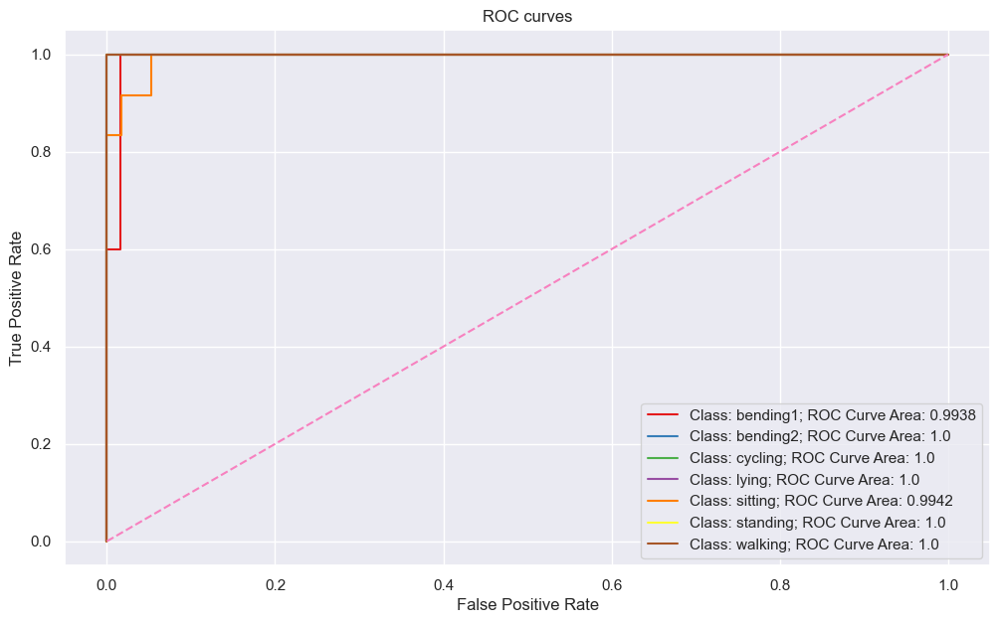

ROC Curve for Test Data


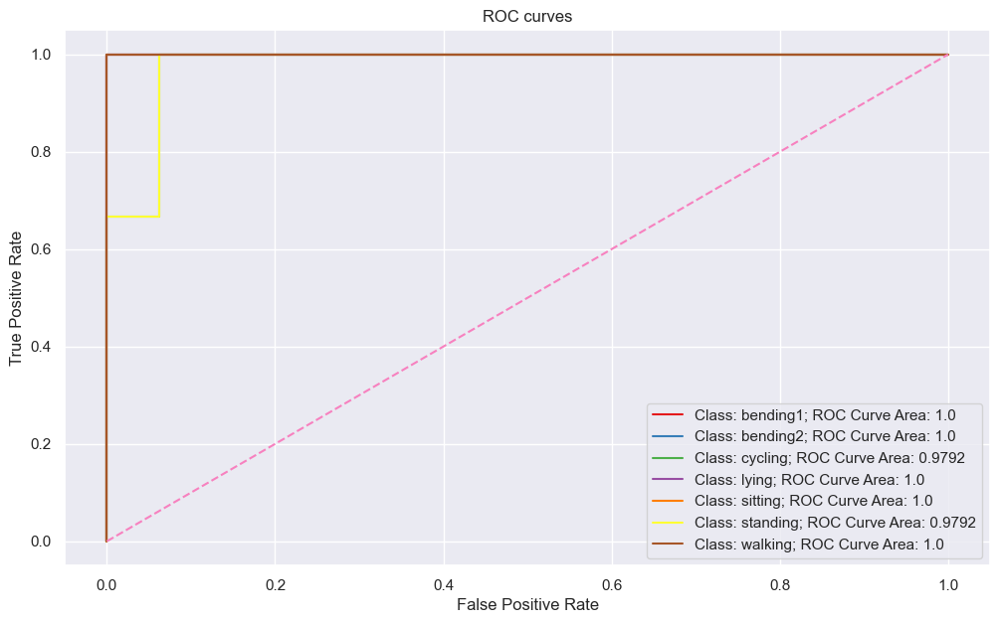

In [30]:
kwargs = {
    'penalty' : 'l1', 
    'max_iter' : 100, 
    'multi_class' : 'multinomial',
    'solver' : 'saga'
}

fold_count = 5
best_l = optimal_L

# performing regression with the given classifier for the best value of L calculated from the above cell
run_classifier_with_metrics(LogisticRegression, 
                                   "Logistic Regression",
                                   best_l, 
                                   kwargs, 
                                   penalty='none',
                                   is_binary_classification=False, 
                                   draw_roc=True)


#### ii. Naive Bayes

In [31]:
kwargs = {
    
}

fold_count = 5
global max_test_accuracy
max_test_accuracy = 0

global optimal_L
optimal_L = 1

# performing regression for each value of L for 20 iterations
for l_val in range(1, 21):
    run_classifier_with_metrics(GaussianNB, 
                                       "Naive Bayes Classifier with Gaussian Prior",
                                       l_val, 
                                       kwargs, 
                                       penalty='none',
                                       is_binary_classification=False, 
                                       draw_roc=False)

Running Naive Bayes Classifier with Gaussian Prior for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 1 | train_score: 1.0 | test_score: 0.8947
Value of L: 1 | train_error: 0.0 | test_error: 0.1053

Running Naive Bayes Classifier with Gaussian Prior for l-value 2


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 2 | train_score: 1.0 | test_score: 0.6316
Value of L: 2 | train_error: 0.0 | test_error: 0.3684

Running Naive Bayes Classifier with Gaussian Prior for l-value 3


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 3 | train_score: 0.9855 | test_score: 0.7368
Value of L: 3 | train_error: 0.0145 | test_error: 0.2632

Running Naive Bayes Classifier with Gaussian Prior for l-value 4


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 4 | train_score: 1.0 | test_score: 0.7895
Value of L: 4 | train_error: 0.0 | test_error: 0.2105

Running Naive Bayes Classifier with Gaussian Prior for l-value 5


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 5 | train_score: 0.9855 | test_score: 0.7895
Value of L: 5 | train_error: 0.0145 | test_error: 0.2105

Running Naive Bayes Classifier with Gaussian Prior for l-value 6


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 6 | train_score: 0.971 | test_score: 0.6316
Value of L: 6 | train_error: 0.029 | test_error: 0.3684

Running Naive Bayes Classifier with Gaussian Prior for l-value 7


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 7 | train_score: 1.0 | test_score: 0.7368
Value of L: 7 | train_error: 0.0 | test_error: 0.2632

Running Naive Bayes Classifier with Gaussian Prior for l-value 8


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 8 | train_score: 0.9855 | test_score: 0.7368
Value of L: 8 | train_error: 0.0145 | test_error: 0.2632

Running Naive Bayes Classifier with Gaussian Prior for l-value 9


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 9 | train_score: 1.0 | test_score: 0.6842
Value of L: 9 | train_error: 0.0 | test_error: 0.3158

Running Naive Bayes Classifier with Gaussian Prior for l-value 10


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 10 | train_score: 1.0 | test_score: 0.7895
Value of L: 10 | train_error: 0.0 | test_error: 0.2105

Running Naive Bayes Classifier with Gaussian Prior for l-value 11


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 11 | train_score: 0.9855 | test_score: 0.6842
Value of L: 11 | train_error: 0.0145 | test_error: 0.3158

Running Naive Bayes Classifier with Gaussian Prior for l-value 12


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 12 | train_score: 1.0 | test_score: 0.6316
Value of L: 12 | train_error: 0.0 | test_error: 0.3684

Running Naive Bayes Classifier with Gaussian Prior for l-value 13


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 13 | train_score: 1.0 | test_score: 0.7368
Value of L: 13 | train_error: 0.0 | test_error: 0.2632

Running Naive Bayes Classifier with Gaussian Prior for l-value 14


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 14 | train_score: 1.0 | test_score: 0.5789
Value of L: 14 | train_error: 0.0 | test_error: 0.4211

Running Naive Bayes Classifier with Gaussian Prior for l-value 15


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 15 | train_score: 1.0 | test_score: 0.5789
Value of L: 15 | train_error: 0.0 | test_error: 0.4211

Running Naive Bayes Classifier with Gaussian Prior for l-value 16


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 16 | train_score: 1.0 | test_score: 0.5263
Value of L: 16 | train_error: 0.0 | test_error: 0.4737

Running Naive Bayes Classifier with Gaussian Prior for l-value 17


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 17 | train_score: 1.0 | test_score: 0.5263
Value of L: 17 | train_error: 0.0 | test_error: 0.4737

Running Naive Bayes Classifier with Gaussian Prior for l-value 18


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 18 | train_score: 1.0 | test_score: 0.6842
Value of L: 18 | train_error: 0.0 | test_error: 0.3158

Running Naive Bayes Classifier with Gaussian Prior for l-value 19


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 19 | train_score: 1.0 | test_score: 0.4737
Value of L: 19 | train_error: 0.0 | test_error: 0.5263

Running Naive Bayes Classifier with Gaussian Prior for l-value 20


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 20 | train_score: 1.0 | test_score: 0.5789
Value of L: 20 | train_error: 0.0 | test_error: 0.4211



The maximum accuracy is 0.8947 (for L-value: 1)
Further calculations will be done with L-value: 1


Running Naive Bayes Classifier with Gaussian Prior for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Confusion matrix for test data:
[[2 0 0 0 0 0 0]
 [0 2 0 0 0 0 0]
 [0 0 3 0 0 0 0]
 [0 0 0 2 1 0 0]
 [0 0 0 0 3 0 0]
 [0 0 0 0 1 2 0]
 [0 0 0 0 0 0 3]]
ROC Curve for Train Data


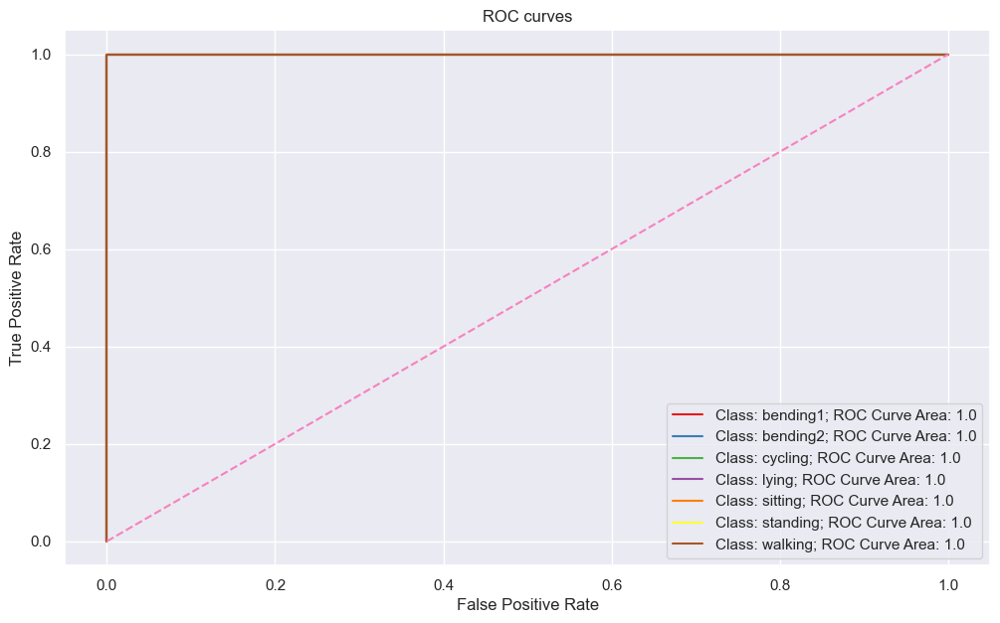

ROC Curve for Test Data


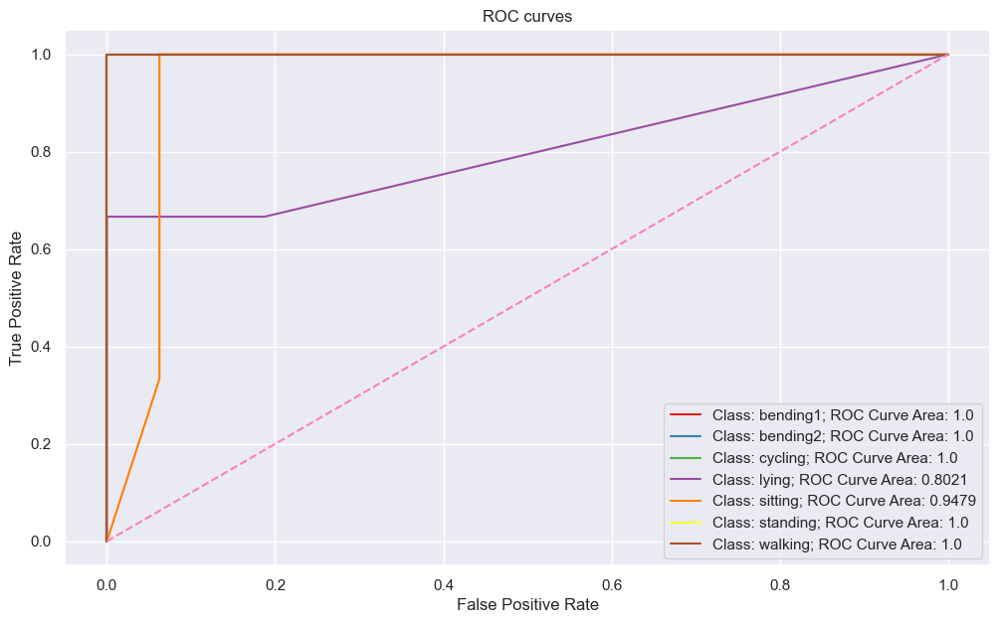

In [32]:
kwargs = {
    
}

fold_count = 5
best_l = optimal_L

# performing regression with the given classifier for the best value of L calculated from the above cell
run_classifier_with_metrics(GaussianNB, 
                                   "Naive Bayes Classifier with Gaussian Prior",
                                   best_l, 
                                   kwargs, 
                                   penalty='none',
                                   is_binary_classification=False, 
                                   draw_roc=True)


In [33]:
kwargs = {
    
}

fold_count = 5
global max_test_accuracy
max_test_accuracy = 0

global optimal_L
optimal_L = 1

# performing regression for each value of L for 20 iterations
for l_val in range(1, 21):
    run_classifier_with_metrics(MultinomialNB, 
                                       "Naive Bayes Classifier with Multinomial Prior",
                                       l_val, 
                                       kwargs, 
                                       penalty='none',
                                       is_binary_classification=False, 
                                       draw_roc=False)

Running Naive Bayes Classifier with Multinomial Prior for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 1 | train_score: 0.9275 | test_score: 0.8947
Value of L: 1 | train_error: 0.0725 | test_error: 0.1053

Running Naive Bayes Classifier with Multinomial Prior for l-value 2


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 2 | train_score: 0.8841 | test_score: 0.7368
Value of L: 2 | train_error: 0.1159 | test_error: 0.2632

Running Naive Bayes Classifier with Multinomial Prior for l-value 3


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 3 | train_score: 0.8986 | test_score: 0.7895
Value of L: 3 | train_error: 0.1014 | test_error: 0.2105

Running Naive Bayes Classifier with Multinomial Prior for l-value 4


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 4 | train_score: 0.913 | test_score: 0.7895
Value of L: 4 | train_error: 0.087 | test_error: 0.2105

Running Naive Bayes Classifier with Multinomial Prior for l-value 5


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 5 | train_score: 0.9275 | test_score: 0.7368
Value of L: 5 | train_error: 0.0725 | test_error: 0.2632

Running Naive Bayes Classifier with Multinomial Prior for l-value 6


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 6 | train_score: 0.9565 | test_score: 0.7368
Value of L: 6 | train_error: 0.0435 | test_error: 0.2632

Running Naive Bayes Classifier with Multinomial Prior for l-value 7


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 7 | train_score: 0.942 | test_score: 0.7368
Value of L: 7 | train_error: 0.058 | test_error: 0.2632

Running Naive Bayes Classifier with Multinomial Prior for l-value 8


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 8 | train_score: 0.942 | test_score: 0.7368
Value of L: 8 | train_error: 0.058 | test_error: 0.2632

Running Naive Bayes Classifier with Multinomial Prior for l-value 9


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 9 | train_score: 0.942 | test_score: 0.7368
Value of L: 9 | train_error: 0.058 | test_error: 0.2632

Running Naive Bayes Classifier with Multinomial Prior for l-value 10


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 10 | train_score: 0.942 | test_score: 0.7368
Value of L: 10 | train_error: 0.058 | test_error: 0.2632

Running Naive Bayes Classifier with Multinomial Prior for l-value 11


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 11 | train_score: 0.942 | test_score: 0.7368
Value of L: 11 | train_error: 0.058 | test_error: 0.2632

Running Naive Bayes Classifier with Multinomial Prior for l-value 12


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 12 | train_score: 0.942 | test_score: 0.7368
Value of L: 12 | train_error: 0.058 | test_error: 0.2632

Running Naive Bayes Classifier with Multinomial Prior for l-value 13


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 13 | train_score: 0.942 | test_score: 0.7895
Value of L: 13 | train_error: 0.058 | test_error: 0.2105

Running Naive Bayes Classifier with Multinomial Prior for l-value 14


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 14 | train_score: 0.942 | test_score: 0.7895
Value of L: 14 | train_error: 0.058 | test_error: 0.2105

Running Naive Bayes Classifier with Multinomial Prior for l-value 15


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 15 | train_score: 0.942 | test_score: 0.7895
Value of L: 15 | train_error: 0.058 | test_error: 0.2105

Running Naive Bayes Classifier with Multinomial Prior for l-value 16


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 16 | train_score: 0.942 | test_score: 0.7895
Value of L: 16 | train_error: 0.058 | test_error: 0.2105

Running Naive Bayes Classifier with Multinomial Prior for l-value 17


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 17 | train_score: 0.942 | test_score: 0.8421
Value of L: 17 | train_error: 0.058 | test_error: 0.1579

Running Naive Bayes Classifier with Multinomial Prior for l-value 18


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 18 | train_score: 0.942 | test_score: 0.8421
Value of L: 18 | train_error: 0.058 | test_error: 0.1579

Running Naive Bayes Classifier with Multinomial Prior for l-value 19


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 19 | train_score: 0.942 | test_score: 0.8421
Value of L: 19 | train_error: 0.058 | test_error: 0.1579

Running Naive Bayes Classifier with Multinomial Prior for l-value 20


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Value of L: 20 | train_score: 0.942 | test_score: 0.8421
Value of L: 20 | train_error: 0.058 | test_error: 0.1579



The maximum accuracy is 0.8947 (for L-value: 1)
Further calculations will be done with L-value: 1


Running Naive Bayes Classifier with Multinomial Prior for l-value 1


Skipping line 485: expected 7 fields, saw 8

Skipping line 485: expected 7 fields, saw 8



Confusion matrix for test data:
[[2 0 0 0 0 0 0]
 [0 2 0 0 0 0 0]
 [0 0 3 0 0 0 0]
 [0 0 0 3 0 0 0]
 [0 0 0 0 2 1 0]
 [0 0 0 1 0 2 0]
 [0 0 0 0 0 0 3]]
ROC Curve for Train Data


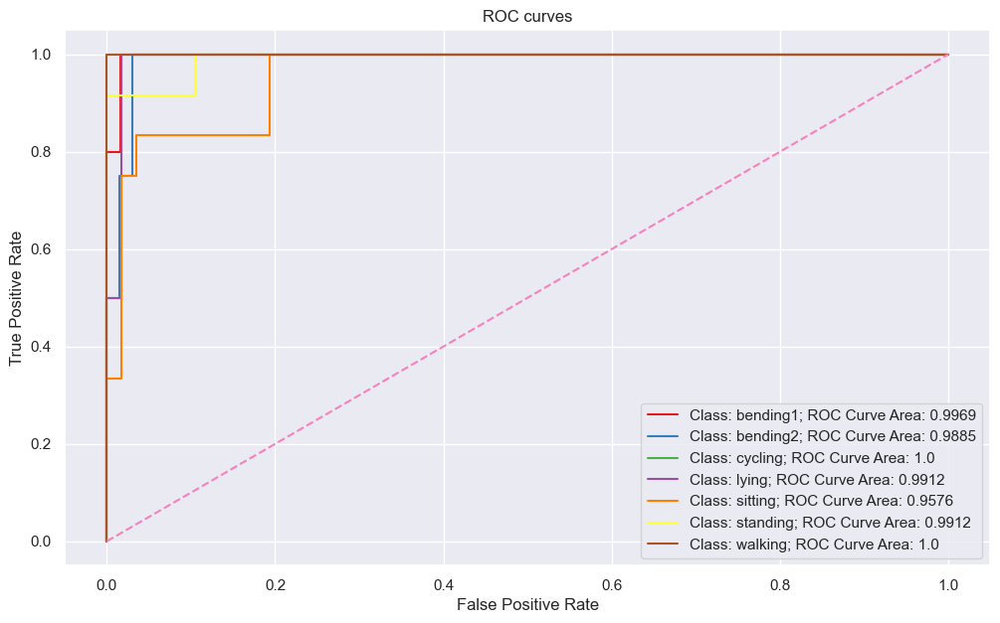

ROC Curve for Test Data


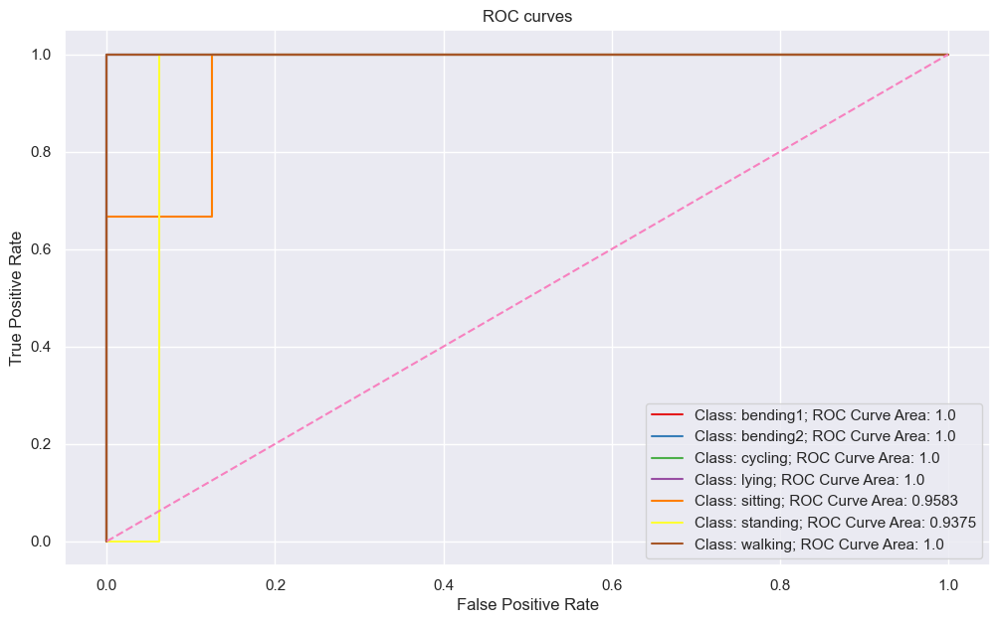

In [34]:
kwargs = {
    
}

fold_count = 5
best_l = optimal_L

# performing regression with the given classifier for the best value of L calculated from the above cell
run_classifier_with_metrics(MultinomialNB, 
                                   "Naive Bayes Classifier with Multinomial Prior",
                                   best_l, 
                                   kwargs, 
                                   penalty='none',
                                   is_binary_classification=False, 
                                   draw_roc=True)

#### ii. Comparison

The Logistic Regression curve exhibits a relatively superior area under the ROC curve (AUC) compared to previous classifiers, such as Gaussian or Multinomial. Consequently, I would assert that Logistic Regression provides better classification performance for the given dataset.

## 3. ISLR 4.8.3

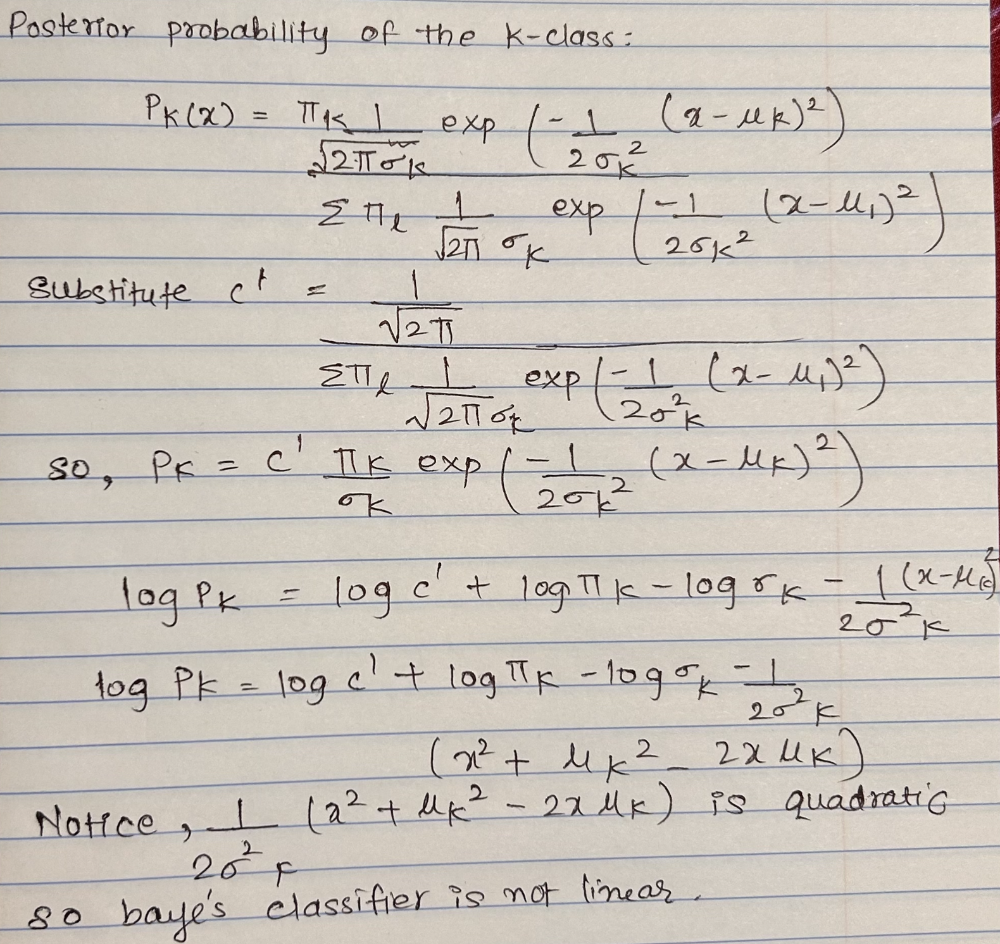

## 4. ISLR 4.8.7

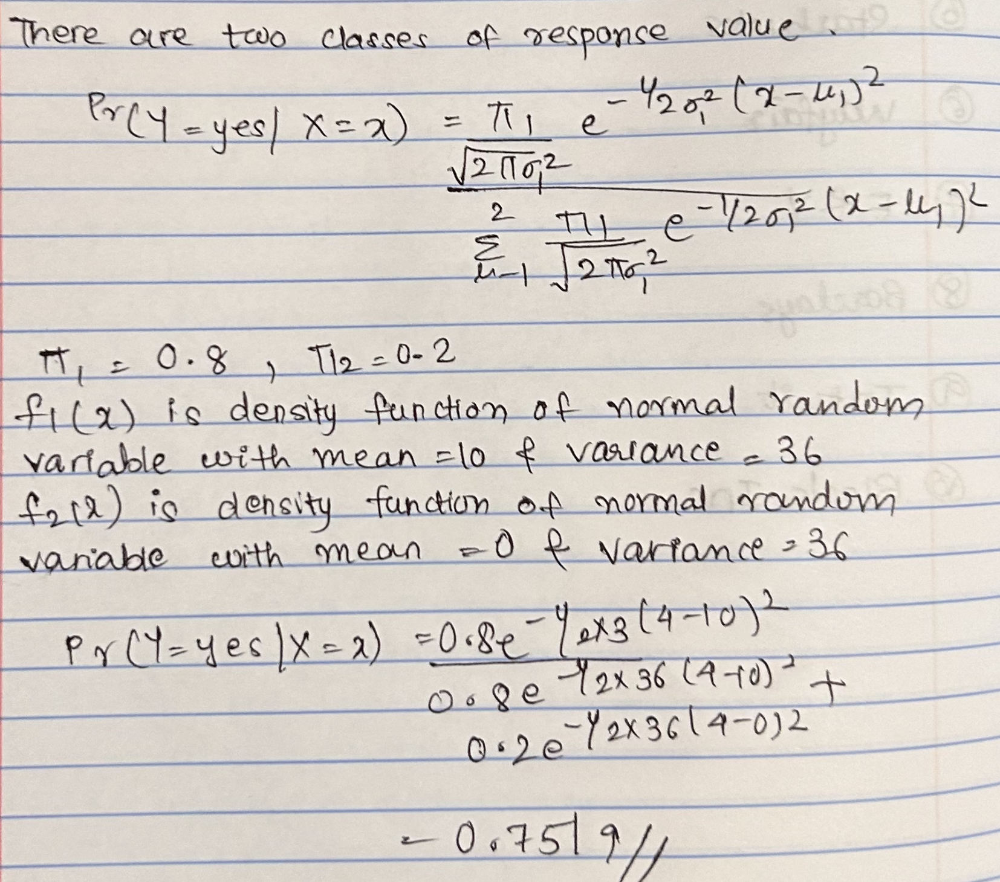

## 5.1. Extra Practice ISLR 4.8.4

## 5.2. Extra Practice ISLR 4.8.9